## **Introduction**
This notebook walks through our analysis of 2.5K cell images.

*The notebook is divided into the following sections:*


1.   Imports
2.   Image Segmentation
3.   Data Augmentation
4.   Feature Extraction
5.   Dimension Reduction Method 1: PCA
6.   Dimension Reduction Method 2: UMAP
7.   Classification Model 1: Multinomial Logistic Regression
8.   Classification Model 2: Random Forest Classifier



## **Imports**
Every time my session restarts, I run these blocks of code. Then I am ready to continue analysis without running all the segmentation/augmentation code.

In [13]:
import numpy as np
import time, os, sys, random
from urllib.parse import urlparse
from skimage import io, color, measure
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from urllib.parse import urlparse
import shutil
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from scipy.ndimage import rotate
import torch
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from google.colab import drive
import matplotlib.patches as mpatches
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.preprocessing import LabelEncoder
import umap
from sklearn.ensemble import RandomForestClassifier

In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(f"Using {device} device")

Using cuda device


In [4]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [5]:
# I saved the results from feature extraction and image augmentation locally to my Google Drive.
# Then whenever my session restarts I can just load the results back and continue analyzing.

all_features = np.load("/content/gdrive/MyDrive/all_features.npy")
all_treatments = np.load("/content/gdrive/MyDrive/all_treatments.npy")

## **Segment Images**
This code was pulled from the reference Colab provided to us. It does not need to be run again. The output masks are available locally in my Google Drive.

In [ ]:
#@markdown ##Step 2: Click Play to Install Cellpose
#@markdown **PLEASE WAIT FOR THIS CELL TO COMPLETE AND YOUR RUN TIME TO RESTART BEFORE CONTINUING TO STEP 3**
#@markdown * After cellpose installation, the runtime will restart a warning that it has **crashed**, which is fine. This is essential to configure the environment.

#https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

#@markdown * On occasion, you may not be able to see the folders on the left panel. Just refresh your browser webpage and it should appear.
#!pip install git+https://www.github.com/mouseland/cellpose.git #to install development version
print(BOLD+UNDERLINE+"Installing Cellpose..."+END)
!pip install uv
!uv pip install "cellpose==2.3.2"
!uv pip install torch torchvision torchaudio
!uv pip install omnipose "numpy<2"

#Fix opencv error: ImportError: cannot import name '_registerMatType' from 'cv2.cv2'
!uv pip install "opencv-python-headless<4.3"
exit(0) #Restart Runtime to use newly installed numpy
#or may get the error: ValueError: numpy.ndarray size changed, may indicate binary incompatibility. Expected 88 from C header, got 80 from PyObject




print("\n"+BOLD+UNDERLINE+"Restarting the RUNTIME. Wait till you see the green tick on the right top, next to RAM and Disk before proceeding."+END)


In [ ]:
#@markdown ##Step 3: Once **Step 2 is completed**, run this cell to configure Cellpose, dependencies and check GPU access
#@markdown

#@markdown *Models will be downloaded when running for the first time*
#disabled installation and import of mxnet as pytorch is the default neural net

#from tifffile import imread, imsave


print ("Downloading Models")
from cellpose import models,core

model_list = models.MODEL_NAMES

#Enable Logging
from cellpose.io import logger_setup
logger_setup()

#https://stackoverflow.com/questions/8924173/how-do-i-print-bold-text-in-python
BOLD = '\033[1m'
UNDERLINE = '\033[4m'
END = '\033[0m'

#Check if colab notebook instance has GPU access
if core.use_gpu()==False:
  #Warnings from the ZeroCost StarDist notebook
  print(BOLD+UNDERLINE+'You do not have GPU access.'+END)
  print('Did you change your runtime ?')
  print('If the runtime setting is correct then Google did not allocate a GPU for your session')
  print('Expect slow performance. To access GPU try reconnecting later')
  use_GPU=False
else:
  print(BOLD+UNDERLINE+"You have access to the GPU."+END+"\nDetails are:")
  print("*************************************************")
  !nvidia-smi
  use_GPU=True

print("*************************************************")
print("Libraries imported and configured")


In [ ]:
path = '/content/gdrive/MyDrive/downsampled_data'

image_format = "tiff" #@param {type:"string"}

input_dir = os.path.join(path, "") #adds separator to the end regardless if path has it or not

# r=root, d=directories, f = files
files=[]

for r, d, f in os.walk(input_dir):
    for fil in f:
      if (image_format):
        if fil.endswith(image_format):
          files.append(os.path.join(r, fil))
      else:
        files.append(os.path.join(r, fil))
    break #only read the root directory; can change this to include levels
if(len(files)==0):
  print("Number of images loaded: %d." %(len(files)))
  print("Cannot read image files. Check if folder has images")
else:
  print("Number of images loaded: %d." %(len(files)))


In [ ]:
image_path = random.choice(files)
image = skimage.io.imread(image_path)

plt.figure(figsize=(4, 2))
plt.imshow(image, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
save_path = '/content/gdrive/MyDrive'

save_dir = save_path+"/Masks/"
if not os.path.exists(save_dir):
  os.makedirs(save_dir)
else:
  print("Existing Mask Directory found. Deleting it.")
  shutil.rmtree(save_dir)

#@markdown ### Step 3: Already ran above, but now implementing a save directory
#@markdown ##### Save Directory will be created in the input path under Masks

In [ ]:
#@markdown ###Step 5: Read and Load all the images
#@markdown #####A random image will be shown as an example with each channel separated. If it is a single channel image, only the one channel will be shown
#imgs = [imread(f) for f in files]

imgs=[] #store all images
#Read images
for f in files:
  im=skimage.io.imread(f)
  n_dim=len(im.shape) #shape of image
  dim=im.shape #dimensions of image
  channel=min(dim) #channel will be dimension with min value usually
  channel_position=dim.index(channel)
  #if no of dim is 3 and channel is first index, swap channel to last index
  if n_dim==3 and channel_position==0:
    #print(dim)
    im=im.transpose(1,2,0)
    dim=im.shape
    #print("Shape changed")
  imgs.append(im)
  print(len(imgs))

nimg = len(imgs)
print("No of images loaded are: ", nimg)

print("Example Image:")

random_idx = random.choice(range(len(imgs)))
x=imgs[random_idx]
n_dim=len(x.shape)
file_name=os.path.basename(files[random_idx])
print(file_name+" has "+str(n_dim)+" dimensions/s")
if n_dim==3:
  channel_image=x.shape[2]
  fig, axs = plt.subplots(1, channel_image,figsize=(12,5))
  print("Image: %s" %(file_name))
  print("Image number: ",random_idx+1)
  for channel in range(channel_image):
      axs[channel].imshow(x[:,:,channel])
      axs[channel].set_title('Channel '+str(channel+1),size=15)
      axs[channel].axis('off')
  fig.tight_layout()
elif n_dim==2:
  print("One Channel")
  plt.imshow(x)
else:
  print("Channel number invalid or dimensions wrong. Image shape is: "+str(x.shape))

In [ ]:
#@markdown #### **STEP 6**.  RUN THIS CELL to CHOOSE a cellpose model. Select the model you want from the dropdown list.
import ipywidgets as widgets
from IPython.display import display

model_choices = widgets.Dropdown(
    options=model_list,
    value='cyto2',
    description='Model Choice:',
    disabled=False,
)

def on_change(model_change):
  print("Model changed to :",model_change.new)
print("Choose MODEL from this list before proceeeding. Default is cyto2:")
model_choices.observe(on_change,names = 'value')

display(model_choices)

In [ ]:
#@markdown #### **STEP 7**.  Define the channels to use for segmentation

model_type= model_choices.value
print("Using model ",model_type)

#@markdown If the image has only one channel, leave it segmentation channel as 0
Channel_for_segmentation="1" #@param[0,1,2,3,4,5]
segment_channel=int(Channel_for_segmentation)

# @markdown ###If you choose cytoplasm, tick if you have a nuclear channel
Use_nuclear_channel= True #@param {type:"boolean"}
Nuclear_channel="3" #@param[1,2,3,4,5]
nuclear_channel=int(Nuclear_channel)

# @markdown ###If cells are elongated or have branches, tick this. It will use omnipose

#disabling omnipose for now as the flag has been removed from CELLPOSE
#omni= False #@param {type:"boolean"}


#@markdown ### Diameter of cell (pixels):
#@markdown #### Enter 0 if you don't know and cellpose will estimate it automatically. You can define this later as well.
Diameter =  0#@param {type:"number"}
diameter=Diameter

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus


#if model_choice=="Cytoplasm":
#  model_type="cyto"

##elif model_choice=="Cytoplasm2":
##  model_type="cyto2"

#elif model_choice=="Cytoplasm2_Omnipose":
#  model_type="cyto2_omni"

#elif model_choice=="Bacteria_Omnipose":
#  model_type="bact_omni"
#  diameter = 0

#elif model_choice=="Nuclei":
#  model_type="nuclei"


# channels = [cytoplasm, nucleus]
if model_type != "nuclei":
  if Use_nuclear_channel:
    channels=[segment_channel,nuclear_channel]
  else:
    channels=[segment_channel,0]
else: #nucleus
  channels=[segment_channel,0]




# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.CellposeModel(gpu=use_GPU, model_type=model_type, net_avg = True)#, omni = omni

# define CHANNELS to run segementation on
# grayscale=0, R=1, G=2, B=3
# channels = [cytoplasm, nucleus]
# if NUCLEUS channel does not exist, set the second channel to 0
# channels = [0,0]
# IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
# channels = [0,0] # IF YOU HAVE GRAYSCALE
# channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
# channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

# or if you have different types of channels in each image
#channels = [[2,3], [0,0], [0,0]]

# if diameter is set to None, the size of the cells is estimated on a per image basis
# you can set the average cell `diameter` in pixels yourself (recommended)
# diameter can be a list or a single number for all images
if diameter == 0:
  diameter = None
  print("Diameter is set to None. The size of the cells will be estimated on a per image basis")

In [ ]:
from skimage.util import img_as_ubyte

Image_Number =  10#@param {type:"number"}
Image_Number-=1 #indexing starts at zero
#print(Image_Number)
Diameter = 0#@param {type:"number"}
#Flow_Threshold=0.4#@param {type:"number"}
Flow_Threshold = 0.6 #@param {type:"slider", min:0.1, max:1.1, step:0.1}
flow_threshold=Flow_Threshold

#Cell_Probability_Threshold=-5#@param {type:"number"}
#Using slider to restrict values
Cell_Probability_Threshold=0 #@param {type:"slider", min:-6, max:6, step:1}
cellprob_threshold=Cell_Probability_Threshold


diameter=Diameter
if diameter == 0:
  diameter = None
if Image_Number == -1:
  Image_Number=0
  #print("Image_Number is set to zero, opening first image.")
try:
    image = imgs[Image_Number]
except IndexError as i:
   print("Image number does not exist",i)
   print("Actual no of images in folder: ",len(imgs))
print("Image: %s" %(os.path.splitext(os.path.basename(files[Image_Number]))[0]))
img1=imgs[Image_Number]

import cv2

masks, flows, styles = model.eval(img1, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
#masks, flows, styles, diams = model.eval(img1, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)



# DISPLAY RESULTS
from cellpose import plot
maski = masks
flowi = flows[0]

#convert to 8-bit if not so it can display properly in the graph
if img1.dtype!='uint8':
  img1=img_as_ubyte(img1)

fig = plt.figure(figsize=(24,8))
#if len(img1.shape)==3:
  #img_ch_plot = img1[:,:,segment_channel]img_ch_plot
plot.show_segmentation(fig, img1 , maski, flowi, channels=channels)
plt.tight_layout()
plt.show()

In [ ]:
#@markdown ### **Step 8. Run Cellpose on folder of images**

#@markdown ###Tick if you want to save the flow image/s:
Save_Flow= False #@param {type:"boolean"}
#@markdown ##### *Flow image will be resized when saved
save_flow=Save_Flow

print("Running segmentation on channel %s" %(segment_channel))
print("Using the model: ",model_type)
if diameter is None:
  print("Diameter will be estimated from the image/s")
else:
  print(f"Cellpose will use a diameter of {diameter}")

print(f"Using a flow threshold of: {flow_threshold} and a cell probability threshold of: {cellprob_threshold}")

#if too many images, it will lead to memory error.
#will evaluate on a per image basis
#masks, flows, styles, diams = model.eval(imgs, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)


#save images in folder with the diameter value used in cellpose
print("Segmentation Done. Saving Masks and flows now")
print("Save Directory is: ",save_dir)
if (not os.path.exists(save_dir)):
    os.mkdir(save_dir)

if save_flow:
  print("Saving Flow")
  flows_save_dir=save_dir+"flows"+os.sep
  print("Save Directory for flows is: ",flows_save_dir)
  if (not os.path.exists(flows_save_dir)):
      os.mkdir(flows_save_dir)


for img_idx, img in enumerate(imgs):
    file_name=os.path.splitext(os.path.basename(files[img_idx]))[0]
    print("\nSegmenting: ",file_name)
    #mask, flow, style, diam = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    mask, flow, style = model.eval(img, diameter=diameter, flow_threshold=flow_threshold,cellprob_threshold=cellprob_threshold, channels=channels)
    #save images in folder with the diameter value used in cellpose
    print("Segmentation complete . Saving Masks and flows")
    #Output name for masks
    mask_output_name=save_dir+"MASK_"+file_name+".tif"
    #Save mask as 16-bit in case this has to be used for detecting than 255 objects
    mask=mask.astype(np.uint16)
    #Save flow as 8-bit
    skimage.io.imsave(mask_output_name,mask, check_contrast=False)
    if save_flow:
      #Output name for flows
      flow_output_name=flows_save_dir+"FLOWS_"+file_name+".tif"
      #Save as 8-bit
      flow_image=flow[0].astype(np.uint8)
      skimage.io.imsave(flow_output_name,flow_image, check_contrast=False)

#Save parameters used in Cellpose
parameters_file=save_dir+"Cellpose_parameters_used.txt"
outFile=open(parameters_file, "w")
outFile.write("CELLPOSE PARAMETERS\n")
outFile.write("Model: "+model_type+"\n")
if diameter == 0:
  diameter = "Automatically estimated by cellpose"
#outFile.write("Omni Flag: "+str(omni)+"\n")
outFile.write("Diameter: "+str(diameter)+"\n")
outFile.write("Flow Threshold: "+str(flow_threshold)+"\n")
outFile.write("Cell probability Threshold: "+str(cellprob_threshold)+"\n")
outFile.close()
print("\nSegmentation complete and files saved")

## **Data Augmentation**
This code prepares the data for feature extraction.

In [ ]:
# Bring in the metadata file

metadata_file = '/content/gdrive/MyDrive/metadata.csv'
metadata_df = pd.read_csv(metadata_file)

In [ ]:
# Drop duplicated index column

metadata_df.drop(columns=['Unnamed: 0'], inplace=True)

In [ ]:
# Create column to match rows to corresponding images and masks

metadata_df['Image_Name'] = metadata_df.FileName_OrigRNA.apply(lambda x: x[:9])

In [ ]:
# Confirm control group

metadata_df[metadata_df.Metadata_pert_iname=='DMSO']

,FileName_OrigRNA,Metadata_ChannelID,Metadata_Plate,Metadata_Well,Metadata_Site,Metadata_AbsPositionZ,Metadata_PositionX,Metadata_PositionY,Metadata_PositionZ,Metadata_Row,Metadata_target,Metadata_experiment_type,Metadata_cell_line,Metadata_pert_iname,Metadata_gene,Metadata_pubchem_cid,Image_Name
9,r01c02f01p01-ch3sk1fk1fl1.tiff,5,BR00116991,A02,1,0.134649,-0.000323,0.000323,-0.000002,1,NaN,Compound,A549,DMSO,NaN,NaN,r01c02f01
10,r01c02f02p01-ch3sk1fk1fl1.tiff,5,BR00116991,A02,2,0.134654,-0.000969,0.000969,-0.000002,1,NaN,Compound,A549,DMSO,NaN,NaN,r01c02f02
11,r01c02f03p01-ch3sk1fk1fl1.tiff,5,BR00116991,A02,3,0.134642,0.000323,0.000969,-0.000002,1,NaN,Compound,A549,DMSO,NaN,NaN,r01c02f03
12,r01c02f04p01-ch3sk1fk1fl1.tiff,5,BR00116991,A02,4,0.134642,0.000969,0.000323,-0.000002,1,NaN,Compound,A549,DMSO,NaN,NaN,r01c02f04
13,r01c02f05p01-ch3sk1fk1fl1.tiff,5,BR00116991,A02,5,0.134655,-0.000969,-0.000323,-0.000002,1,NaN,Compound,A549,DMSO,NaN,NaN,r01c02f05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3325,r16c10f05p01-ch3sk1fk1fl1.tiff,5,BR00116991,P10,5,0.134401,-0.000969,-0.000323,-0.000002,16,NaN,Compound,A549,DMSO,NaN,NaN,r16c10f05
3326,r16c10f06p01-ch3sk1fk1fl1.tiff,5,BR00116991,P10,6,0.134397,0.000323,-0.000323,-0.000002,16,NaN,Compound,A549,DMSO,NaN,NaN,r16c10f06
3327,r16c10f07p01-ch3sk1fk1fl1.tiff,5,BR00116991,P10,7,0.134395,0.000969,-0.000969,-0.000002,16,NaN,Compound,A549,DMSO,NaN,NaN,r16c10f07
3328,r16c10f08p01-ch3sk1fk1fl1.tiff,5,BR00116991,P10,8,0.134399,-0.000323,-0.000969,-0.000002,16,NaN,Compound,A549,DMSO,NaN,NaN,r16c10f08


In [ ]:
# Create paths to relevant files

image_folder = '/content/gdrive/MyDrive/downsampled_data'
mask_folder = '/content/gdrive/MyDrive/Masks'
csv_file = '/content/gdrive/MyDrive/metadata.csv'

df_labels = pd.read_csv(csv_file)
filenames = df_labels['Metadata_pert_iname'].tolist()

In [ ]:
metadata_dict = metadata_df.set_index("Image_Name").to_dict('index')

In [ ]:
image_files = os.listdir(image_folder)
mask_files = os.listdir(mask_folder)

In [ ]:
mask_dict = {mask_file[5:14]: mask_file for mask_file in mask_files}

In [ ]:
pip install imagecodecs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 MB 49.7 MB/s eta 0:00:00


In [ ]:
# This code block does two main things:
# 1. Flips each image and corresponding mask (excluding control group) by 180 degrees to double sample size
# 2. Maps each image to its corresponding mask and treatment group (from metadata)

images = []
masks = []
treatment_labels = []

rotation_angles = [0, 180]

for image_file in image_files:
    key = image_file[:9]
    if key not in metadata_dict:
        continue

    image_path = os.path.join(image_folder, image_file)
    img = io.imread(image_path)

    mask_file = mask_dict.get(key)
    if mask_file is None:
        continue
    mask_path = os.path.join(mask_folder, mask_file)
    mask_img = io.imread(mask_path)

    treatment = metadata_dict[key].get('Metadata_pert_iname', 'unknown')

    if treatment.lower() == 'dmso':
        images.append(img)
        masks.append(mask_img)
        treatment_labels.append(treatment)
    else:
        for angle in rotation_angles:
            if angle == 0:
                rotated_img = img
                rotated_mask = mask_img
            else:
                k = angle // 90
                rotated_img = np.rot90(img, k=k)
                rotated_mask = np.rot90(mask_img, k=k)

            images.append(rotated_img)
            masks.append(rotated_mask)
            treatment_labels.append(treatment)

print(f"Total number of images after augmentation: {len(images)}")
print(f"Number of unique treatments: {len(set(treatment_labels))}")

Total number of images after augmentation: 5225
Number of unique treatments: 250


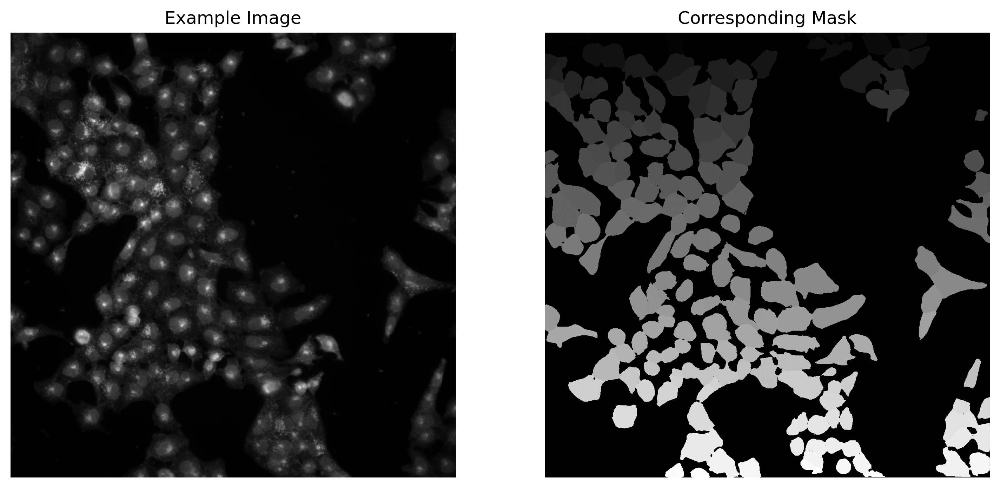

In [ ]:
# Shows an example cell image and its corresponding mask

example_index = 0

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(images[example_index], cmap='gray')
axes[0].set_title("Example Image")
axes[0].axis("off")

axes[1].imshow(masks[example_index], cmap='gray')
axes[1].set_title("Corresponding Mask")
axes[1].axis("off")

plt.show()

## **Feature Extraction**
This code extracts features from the ~800K cells to use in downstream analysis.

In [ ]:
# Extracts 11 features from each cell and generates arrays for the features and treatment.
# The output of this code will be the data used in all downstream analysis.

def extract_enhanced_features(image, mask):
    regions = measure.regionprops(mask, intensity_image=image)
    features = []
    for region in regions:
        features.append([
            region.area,
            region.perimeter,
            region.eccentricity,
            region.mean_intensity,
            region.solidity,
            region.extent,
            region.major_axis_length,
            region.minor_axis_length,
            region.orientation,
            region.perimeter_crofton,
            np.std(region.intensity_image),
        ])
    return np.array(features)

all_features = []
all_treatments = []

for img, mask, treatment in zip(images, masks, treatment_labels):
    if img.ndim == 3:
        img_gray = color.rgb2gray(img)
    else:
        img_gray = img
    feats = extract_enhanced_features(img_gray, mask)
    if feats.size == 0:
        print(f"No cell features extracted from one image; skipping it.")
        continue
    all_features.append(feats)
    all_treatments.extend([treatment] * feats.shape[0])

if len(all_features) == 0:
    raise ValueError("No features extracted from any image/mask pair.")

all_features = np.vstack(all_features)
all_treatments = np.array(all_treatments)

In [ ]:
# Sanity check for number of data points per treatment

unique_treatments, counts = np.unique(all_treatments, return_counts=True)
for treatment, count in zip(unique_treatments, counts):
    print(f"Treatment: {treatment}, Data Points: {count}")

Treatment: 1-octanol, Data Points: 2856
Treatment: 2,5-furandimethanol, Data Points: 2888
Treatment: 2-Oleoylglycerol, Data Points: 3746
Treatment: 4-CMTB, Data Points: 4438
Treatment: 4-methylhistamine, Data Points: 4384
Treatment: 7-hydroxystaurosporine, Data Points: 1728
Treatment: A205804, Data Points: 3896
Treatment: AC-710, Data Points: 2960
Treatment: AK-7, Data Points: 2868
Treatment: ANR-94, Data Points: 2866
Treatment: AR-12, Data Points: 706
Treatment: AVL-292, Data Points: 1520
Treatment: AZ191, Data Points: 1832
Treatment: AZD7762, Data Points: 1874
Treatment: AZD9668, Data Points: 3170
Treatment: BAM7, Data Points: 3460
Treatment: BAN-ORL-24, Data Points: 1894
Treatment: BAX-channel-blocker, Data Points: 1690
Treatment: BAY-87-2243, Data Points: 2916
Treatment: BI-2536, Data Points: 2182
Treatment: BMS-536924, Data Points: 1238
Treatment: BQ-788, Data Points: 3534
Treatment: BRL-50481, Data Points: 3096
Treatment: BVT-948, Data Points: 2936
Treatment: CC-401, Data Points:

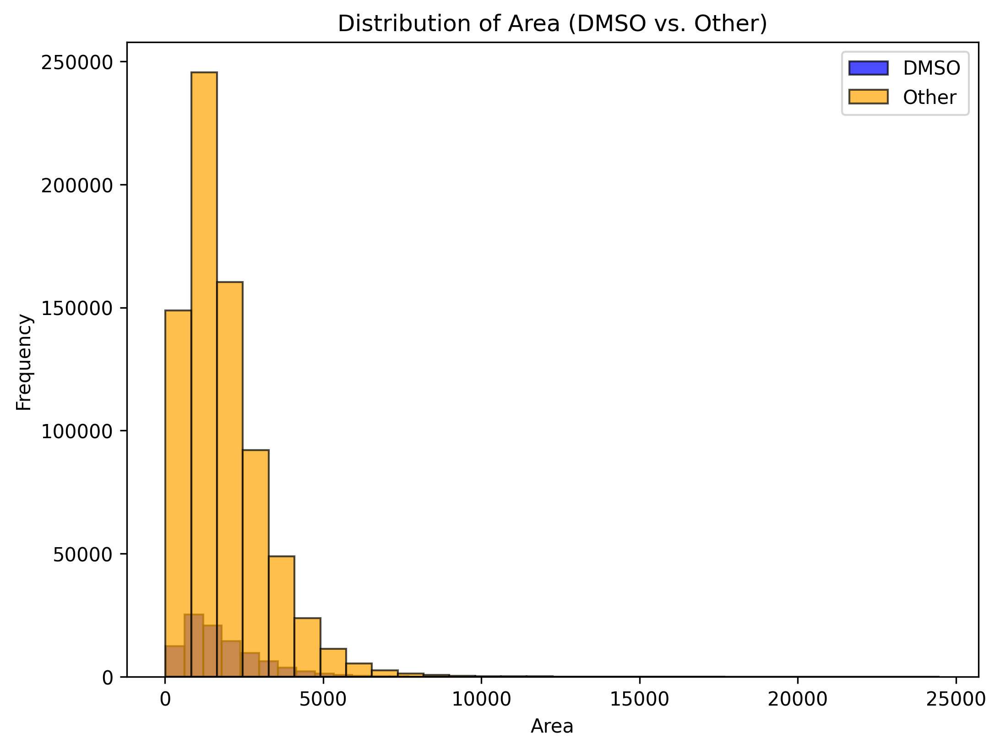

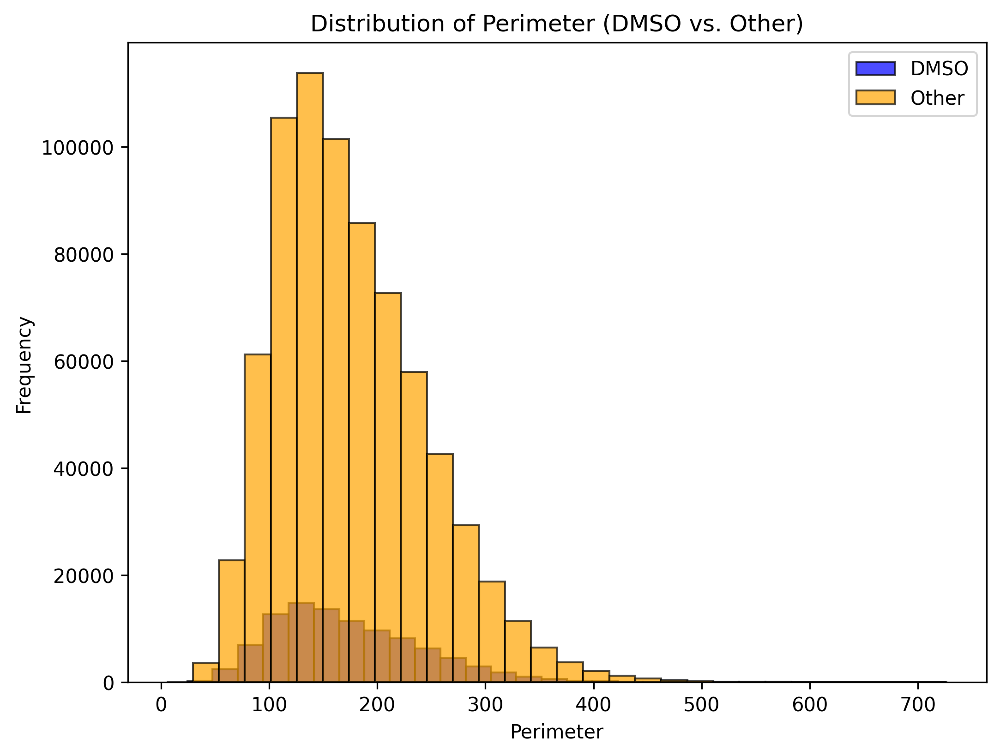

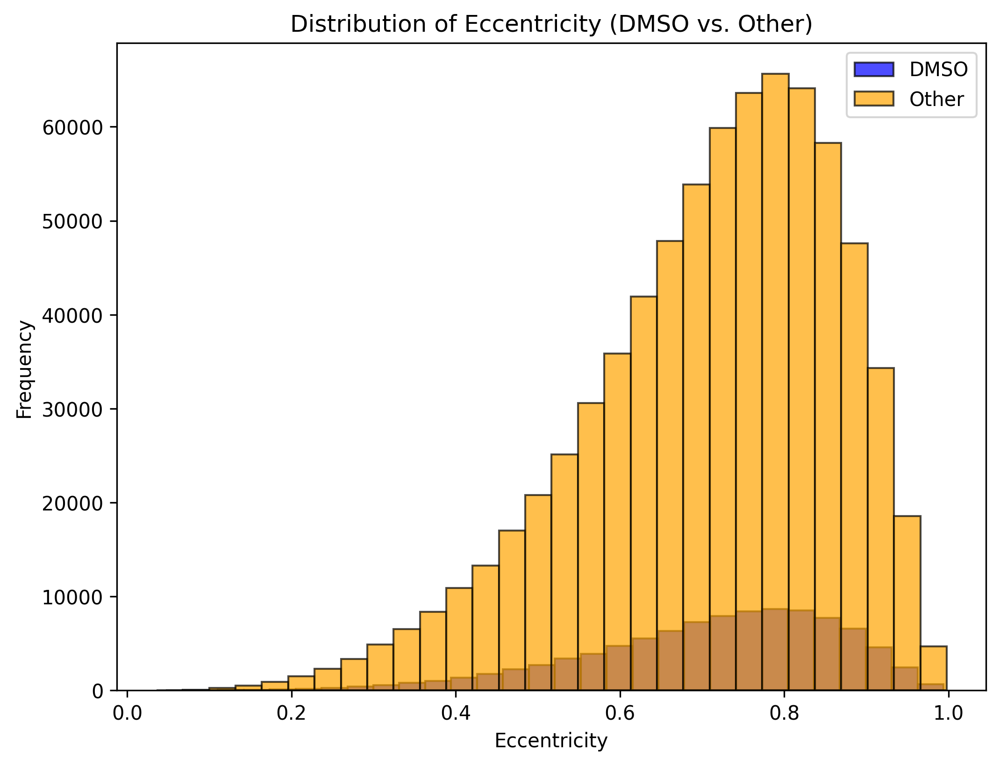

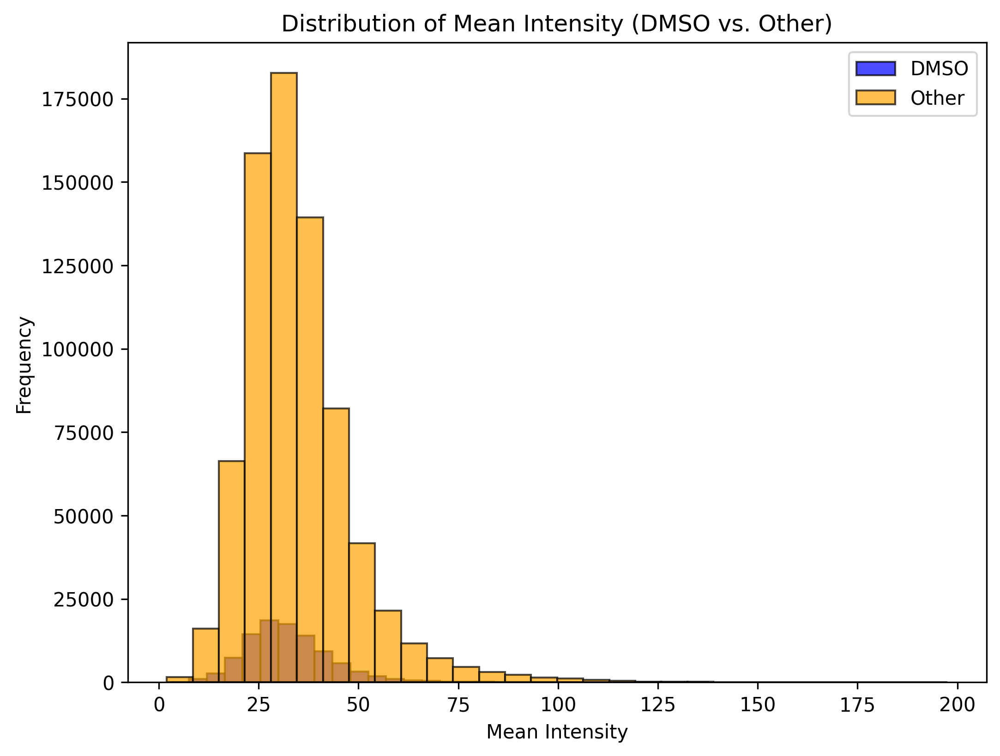

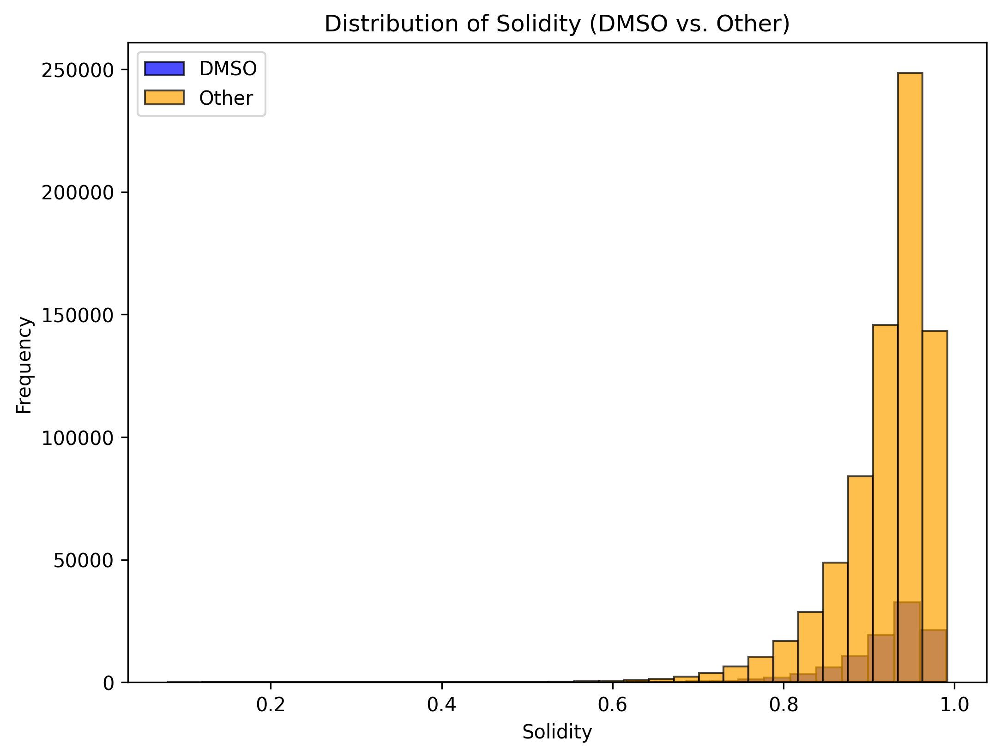

...

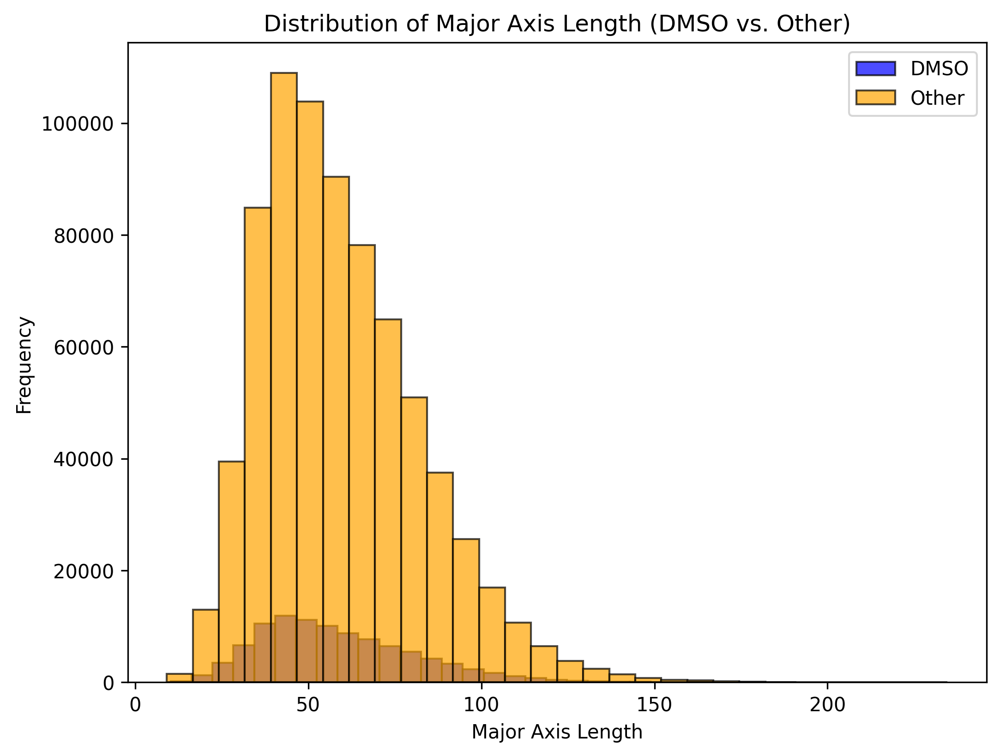

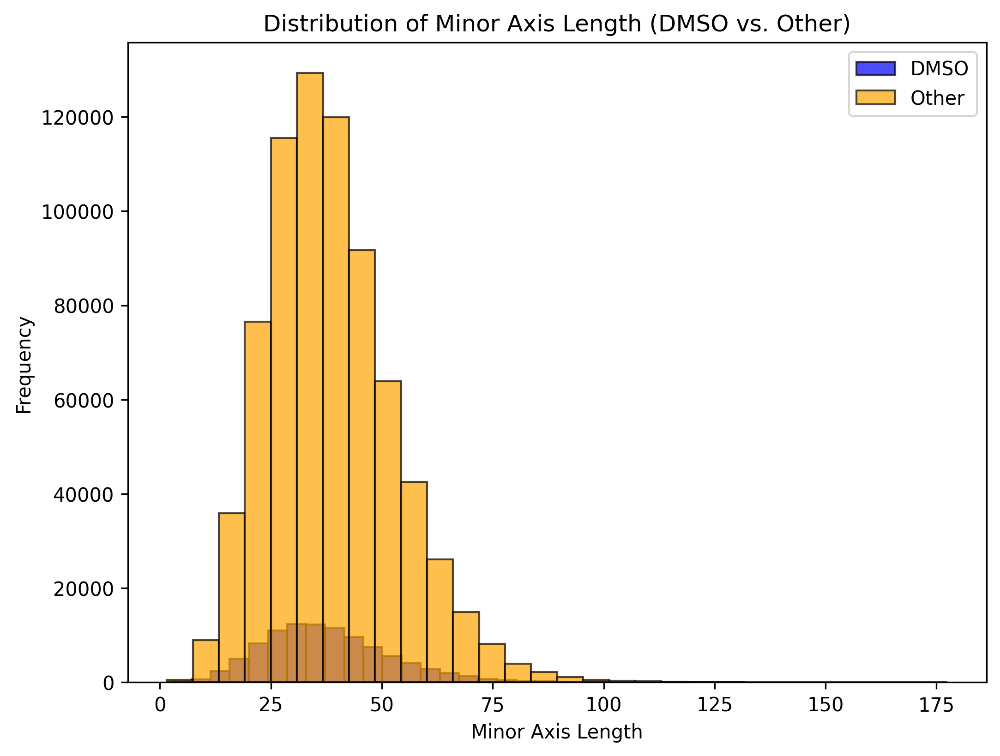

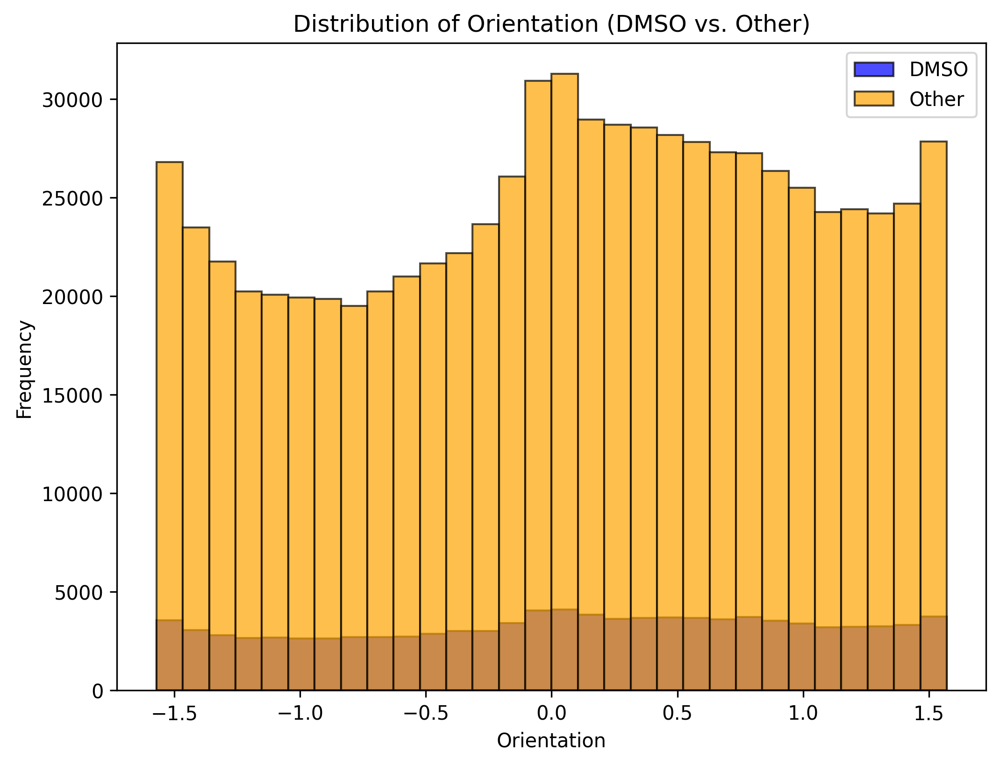

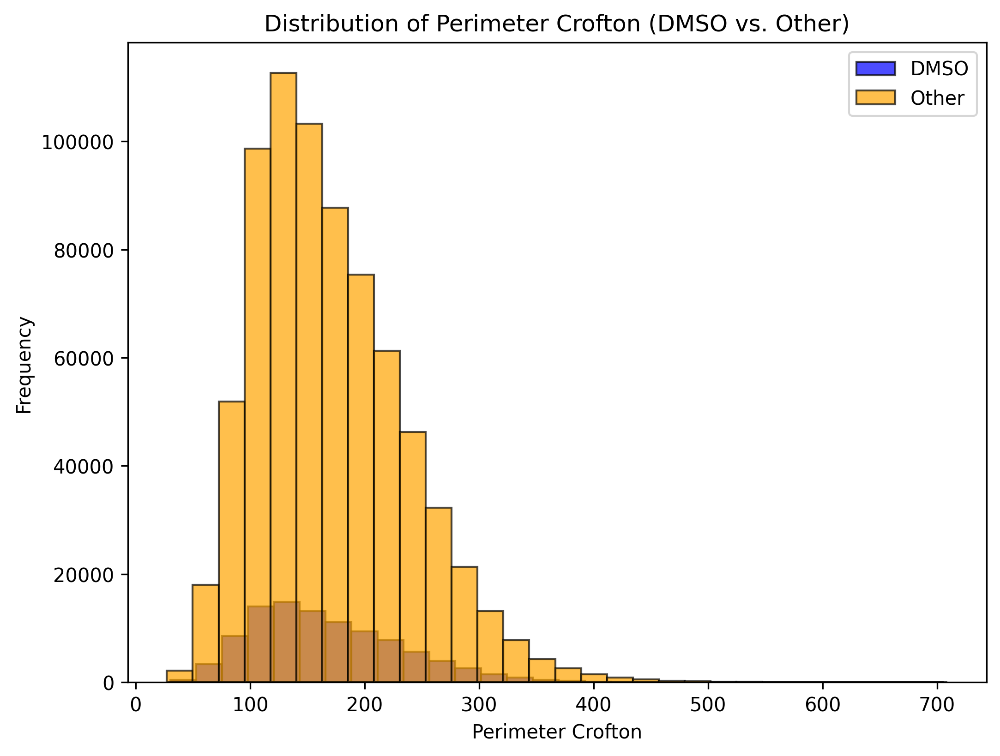

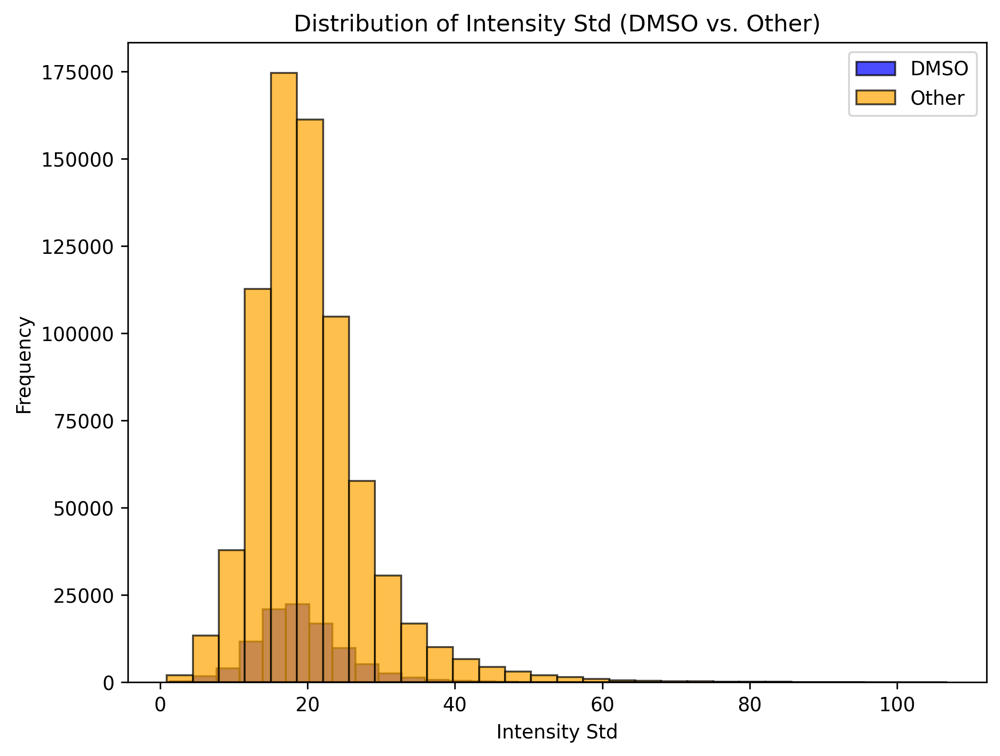

In [ ]:
# Exploratory data analysis of the features
# Explored the difference in distributions for treatment vs control groups (histograms)

feature_names = [
    "Area", "Perimeter", "Eccentricity", "Mean Intensity",
    "Solidity", "Extent", "Major Axis Length", "Minor Axis Length",
    "Orientation", "Perimeter Crofton", "Intensity Std"
]

all_treatments = np.array(all_treatments)

dmso_indices = np.where(np.char.lower(all_treatments) == 'dmso')[0]
non_dmso_indices = np.where(np.char.lower(all_treatments) != 'dmso')[0]

for i, feature_name in enumerate(feature_names):
    plt.figure(figsize=(8, 6))
    plt.hist(all_features[dmso_indices, i], bins=30, alpha=0.7,
             label='DMSO', color='blue', edgecolor='black')
    plt.hist(all_features[non_dmso_indices, i], bins=30, alpha=0.7,
             label='Other', color='orange', edgecolor='black')
    plt.xlabel(feature_name)
    plt.ylabel("Frequency")
    plt.title(f"Distribution of {feature_name} (DMSO vs. Other)")
    plt.legend()
    plt.show()


In [ ]:
# Saved the features and labels locally (this line let's us run the code at the top of this file)

np.save("/content/gdrive/MyDrive/all_features.npy", all_features)
np.save("/content/gdrive/MyDrive/all_treatments.npy", all_treatments)

## **Dimension Reduction Method 1: PCA**

In [6]:
# Scales features

scaler = StandardScaler()
features_scaled = scaler.fit_transform(all_features)

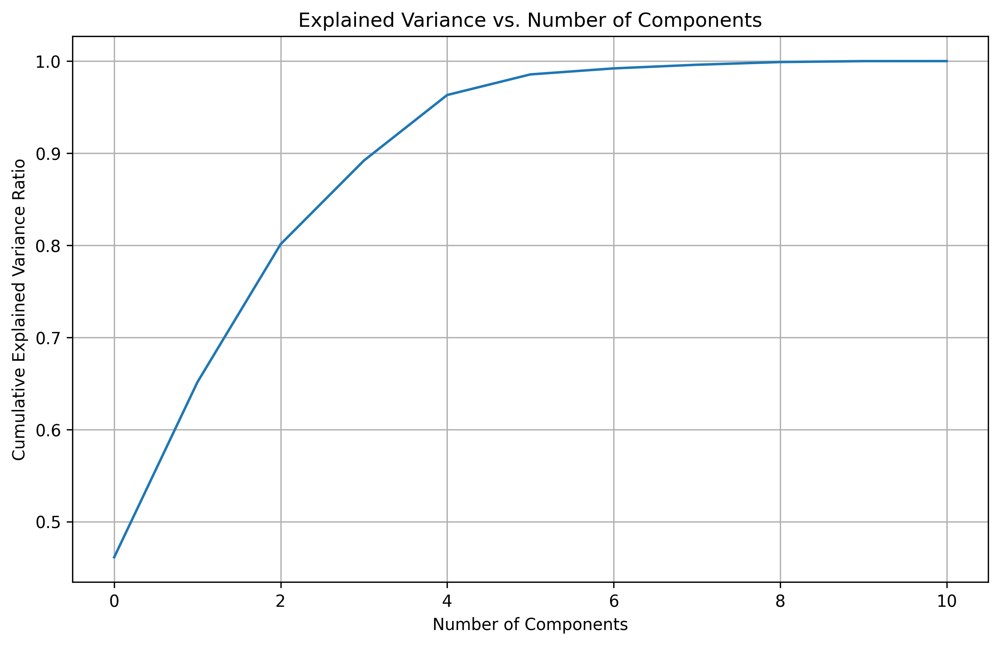

Number of components needed for 95% variance: 5


In [ ]:
# Performs PCA on scaled features
# Finds the number of principal components needed to capture 95% of the variance in data (5 PC's)
# Plots scree plot

pca = PCA()
pca.fit(features_scaled)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Explained Variance vs. Number of Components')
plt.grid(True)
plt.show()

n_components = np.where(np.cumsum(pca.explained_variance_ratio_) >= 0.95)[0][0] + 1
print(f"Number of components needed for 95% variance: {n_components}")

pca = PCA(n_components=n_components)
features_pca = pca.fit_transform(features_scaled)

In [ ]:
# Applies k means clustering to scaled data with 10 clusters

kmeans = KMeans(n_clusters=10, random_state=42)
cluster_assignments = kmeans.fit_predict(features_scaled)

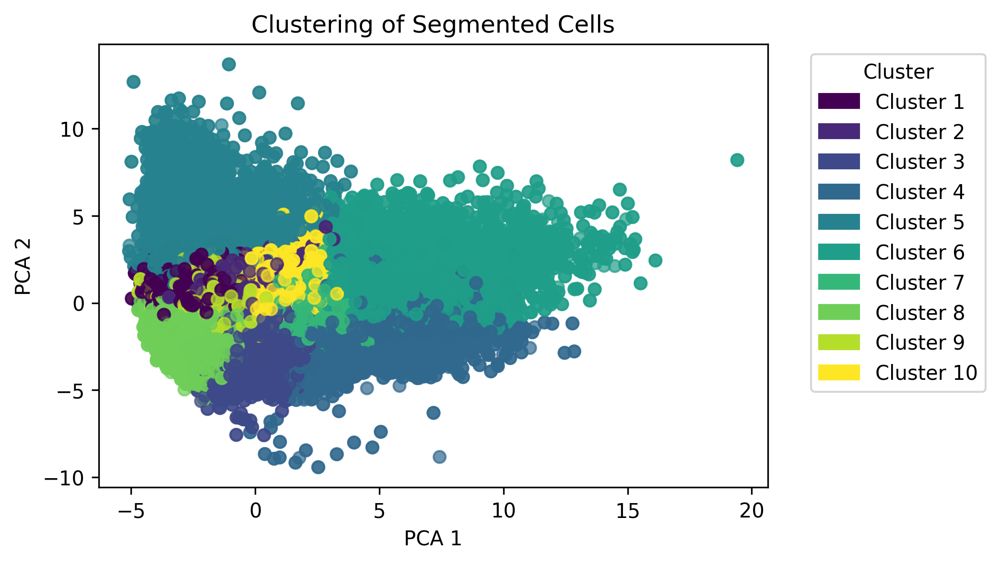

In [ ]:
# Plots first two principal components colored by k means clusters

discrete_cmap = plt.get_cmap('viridis', kmeans.n_clusters)

plt.figure(figsize=(6, 4))
scatter = plt.scatter(features_pca[:, 0], features_pca[:, 1],
                      c=cluster_assignments, cmap=discrete_cmap, alpha=0.7)
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Clustering of Segmented Cells')

handles = []
for i in range(kmeans.n_clusters):
    patch = mpatches.Patch(color=discrete_cmap(i), label=f'Cluster {i+1}')
    handles.append(patch)
plt.legend(handles=handles, title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [ ]:
# Plots stacked bar chart of the 10 k means clusters
# Stacks represent the different treatment groups
# The goal of this visualization was to see if the clusters were grouping treatment groups in a meaningful way

df = pd.DataFrame({
    'cluster': cluster_assignments,
    'treatment': all_treatments
})

cluster_treatment_counts = df.groupby(['cluster', 'treatment']).size().unstack(fill_value=0)

cluster_treatment_counts.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title("Treatment Distribution per Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Samples")
plt.legend(title="Treatment", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


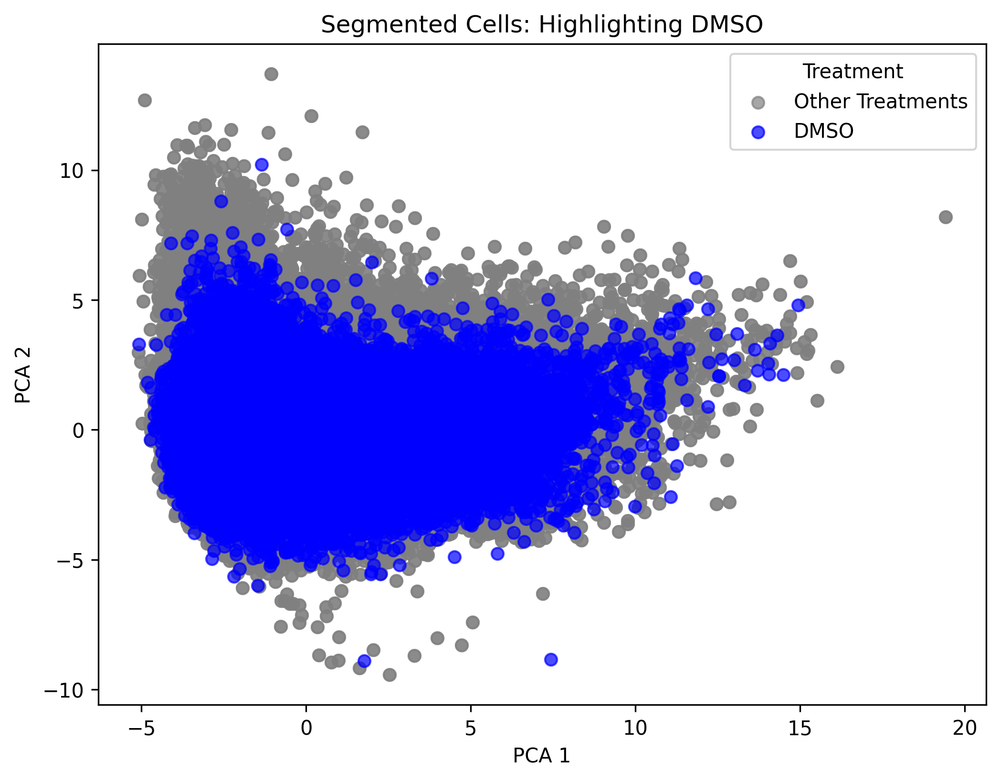

In [ ]:
# Plotting first two principal components colored by control vs treatment groups

specific_treatment = 'DMSO'

mask_specific = (all_treatments == specific_treatment)

plt.figure(figsize=(8, 6))

plt.scatter(features_pca[~mask_specific, 0],
            features_pca[~mask_specific, 1],
            color='grey', alpha=0.7, label='Other Treatments')

plt.scatter(features_pca[mask_specific, 0],
            features_pca[mask_specific, 1],
            color='blue', alpha=0.7, label=specific_treatment)

plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.title('Segmented Cells: Highlighting ' + specific_treatment)
plt.legend(title="Treatment")
plt.show()

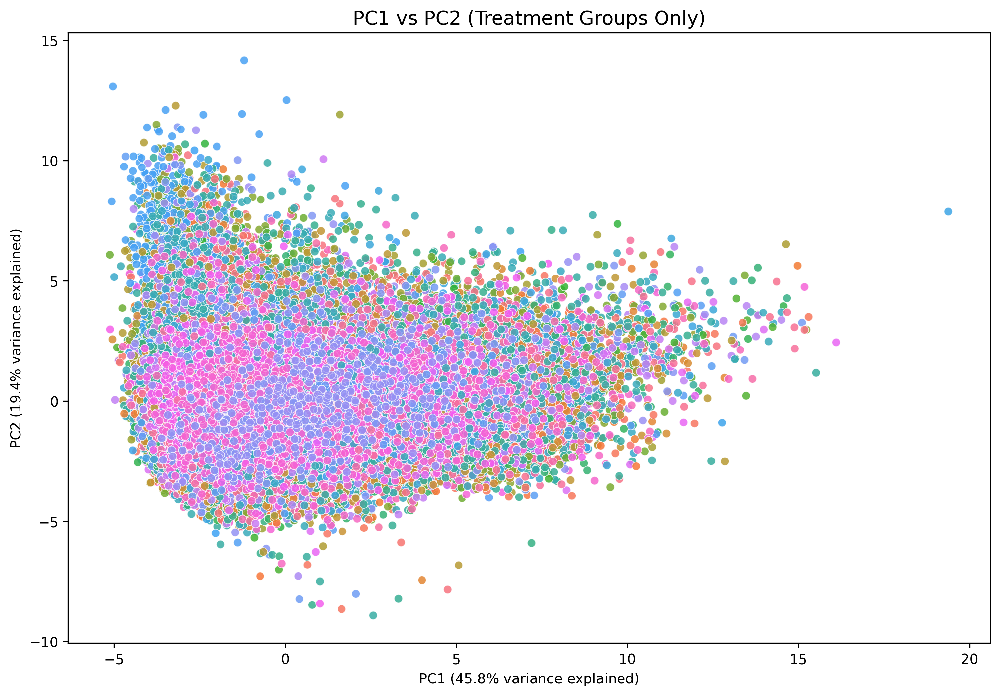


Total variance explained by first 2 PCs: 65.2%


In [16]:
# Plots first two principal components excluding the control group and colored by the different treatment groups

all_treatments_series = pd.Series(all_treatments)

non_dmso_mask = ~(all_treatments_series.str.upper() == 'DMSO')

features_no_dmso = features_scaled[non_dmso_mask]
treatments_no_dmso = all_treatments[non_dmso_mask]

pca_treatments = PCA()
features_pca_treatments = pca_treatments.fit_transform(features_no_dmso)

plt.figure(figsize=(12, 8))
sns.scatterplot(
    x=features_pca_treatments[:, 0],
    y=features_pca_treatments[:, 1],
    hue=treatments_no_dmso,
    alpha=0.6,
    legend=False
)

explained_var_treatments = pca_treatments.explained_variance_ratio_ * 100

plt.title('PC1 vs PC2 (Treatment Groups Only)', fontsize=14)
plt.xlabel(f'PC1 ({explained_var_treatments[0]:.1f}% variance explained)')
plt.ylabel(f'PC2 ({explained_var_treatments[1]:.1f}% variance explained)')

plt.show()

print(f"\nTotal variance explained by first 2 PCs: {sum(explained_var_treatments[:2]):.1f}%")

In [ ]:
le = LabelEncoder()
treatment_labels_encoded = le.fit_transform(treatments_no_dmso)

In [ ]:
# Computes silhouette score for the treatment group clusters excluding the control group

silhouette_avg = silhouette_score(features_no_dmso, treatment_labels_encoded, metric='euclidean')
print("Average silhouette score: {:.3f}".format(silhouette_avg))

Average silhouette score: -0.139


## **Dimension Reduction Method 2: UMAP**

In [48]:
# Performs UMAP dimension reduction (to compare with PCA results)

umap_reducer = umap.UMAP(n_components=2, random_state=42)
features_umap = umap_reducer.fit_transform(features_no_dmso)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


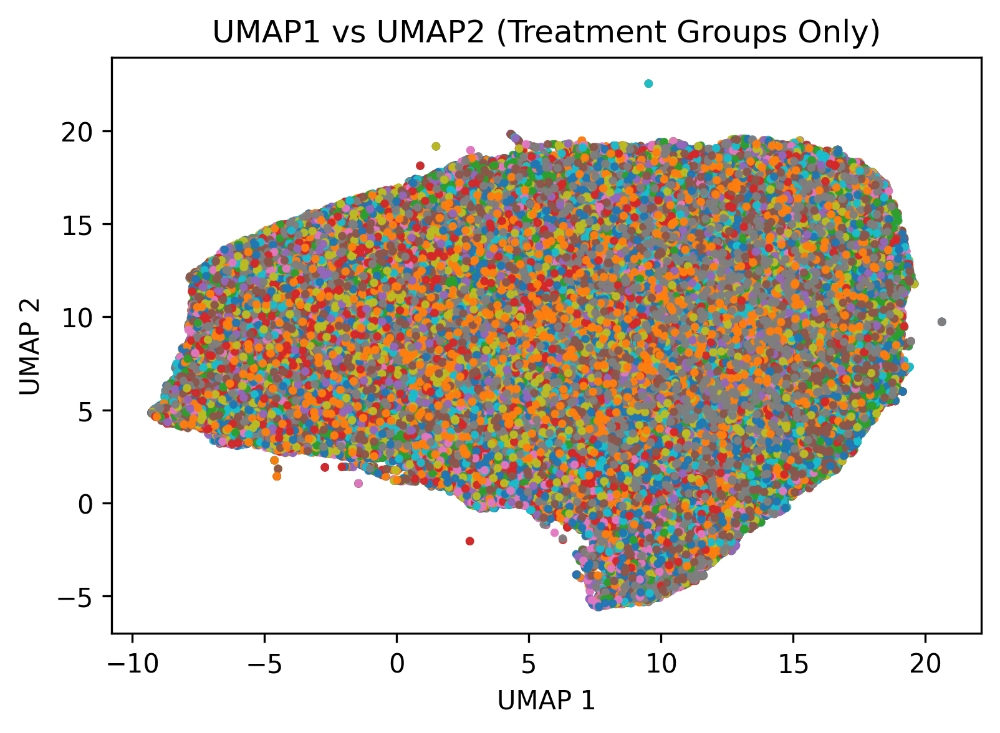

In [54]:
# Plots first two UMAPs excluding the control group

unique_treatments = np.unique(treatments_no_dmso)
discrete_cmap = plt.get_cmap('tab10', len(unique_treatments))

treatment_to_int = {t: i for i, t in enumerate(unique_treatments)}
treatment_ints = np.array([treatment_to_int[t] for t in treatments_no_dmso])

plt.figure(figsize=(6, 4))
plt.scatter(features_umap[:, 0], features_umap[:, 1],
            c=treatment_ints, cmap=discrete_cmap, alpha=0.7, s=5)
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.title('UMAP1 vs UMAP2 (Treatment Groups Only)')

plt.show()

## **Classification Model 1: Multinomial Logistic Regression**

In [56]:
# Trains multinomial logistic regression model on the scaled features for all data points (control and treatment)
# Outputs classification report (12% accuracy)

X_train, X_test, y_train, y_test = train_test_split(features_scaled, all_treatments,
                                                    test_size=0.2, random_state=42, stratify=all_treatments)

log_reg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, random_state=42)
log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)
print(classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                                         precision    recall  f1-score   support

                              1-octanol       0.00      0.00      0.00       571
                    2,5-furandimethanol       0.00      0.00      0.00       578
                       2-Oleoylglycerol       0.00      0.00      0.00       749
                                 4-CMTB       0.00      0.00      0.00       887
                      4-methylhistamine       0.00      0.00      0.00       877
                 7-hydroxystaurosporine       0.00      0.00      0.00       346
                                A205804       0.00      0.00      0.00       779
                                 AC-710       0.00      0.00      0.00       592
                                   AK-7       0.00      0.00      0.00       574
                                 ANR-94       0.00      0.00      0.00       573
                                  AR-12       0.00      0.00      0.00       141
                           

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Trains multinomial logistic regression model on the principal components for all data points (control and treatment)
# Outputs classification report (also 12% accuracy)

X_train, X_test, y_train, y_test = train_test_split(
    features_pca,
    all_treatments,
    test_size=0.2,
    random_state=42,
    stratify=all_treatments
)

log_reg = LogisticRegression(multi_class='multinomial',
                            solver='lbfgs',
                            max_iter=1000)
log_reg.fit(X_train, y_train)

y_pred = log_reg.predict(X_test)
print(classification_report(y_test, y_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                                         precision    recall  f1-score   support

                              1-octanol       0.00      0.00      0.00       571
                    2,5-furandimethanol       0.00      0.00      0.00       578
                       2-Oleoylglycerol       0.00      0.00      0.00       749
                                 4-CMTB       0.00      0.00      0.00       887
                      4-methylhistamine       0.00      0.00      0.00       877
                 7-hydroxystaurosporine       0.00      0.00      0.00       346
                                A205804       0.00      0.00      0.00       779
                                 AC-710       0.00      0.00      0.00       592
                                   AK-7       0.00      0.00      0.00       574
                                 ANR-94       0.00      0.00      0.00       573
                                  AR-12       0.00      0.00      0.00       141
                           

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## **Classification Model 2: Random Forest Classifier**

In [7]:
# Finds the 10 treatment groups with the most data points

treatment_counts = pd.Series(all_treatments)[pd.Series(all_treatments).str.upper() != 'DMSO'].value_counts()
top_10_treatments = treatment_counts.head(10)

print("Top 10 non-DMSO treatments by sample count:")
for treatment, count in top_10_treatments.items():
    print(f"{treatment}: {count} samples")

Top 10 non-DMSO treatments by sample count:
FK-866: 6700 samples
lonafarnib: 6184 samples
ZK-93423: 6002 samples
GSK2110183: 5254 samples
thiostrepton: 5160 samples
thioguanine: 5098 samples
nilvadipine: 4962 samples
TFC-007: 4848 samples
zamifenacin: 4756 samples
azacitidine: 4514 samples


In [22]:
# Trains random forest classifier on the scaled data from the top 10 treatment groups (excluding control group)
# Accuracy 85%

top_10_mask = np.isin(treatments_no_dmso, top_10_treatments.index)

X_top10 = features_no_dmso[top_10_mask]
y_top10 = treatments_no_dmso[top_10_mask]

X_train, X_test, y_train, y_test = train_test_split(
    X_top10, y_top10,
    test_size=0.2,
    random_state=42,
    stratify=y_top10
)

In [9]:
rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

      FK-866       0.82      0.86      0.84      1340
  GSK2110183       0.86      0.83      0.84      1051
     TFC-007       0.86      0.86      0.86       970
    ZK-93423       0.83      0.83      0.83      1200
 azacitidine       0.89      0.84      0.86       903
  lonafarnib       0.85      0.83      0.84      1237
 nilvadipine       0.87      0.84      0.86       992
 thioguanine       0.82      0.89      0.86      1020
thiostrepton       0.86      0.84      0.85      1032
 zamifenacin       0.84      0.84      0.84       951

    accuracy                           0.85     10696
   macro avg       0.85      0.85      0.85     10696
weighted avg       0.85      0.85      0.85     10696



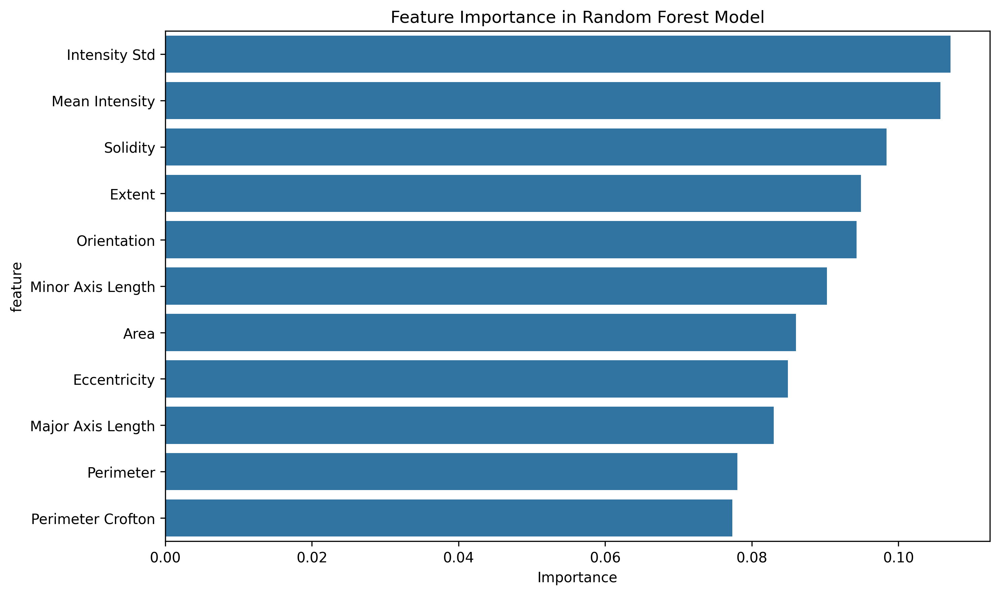

In [11]:
# Extracts the feature importance for the random forest model

feature_names = [
    "Area", "Perimeter", "Eccentricity", "Mean Intensity",
    "Solidity", "Extent", "Major Axis Length", "Minor Axis Length",
    "Orientation", "Perimeter Crofton", "Intensity Std"
]

feature_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': rf.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance in Random Forest Model')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

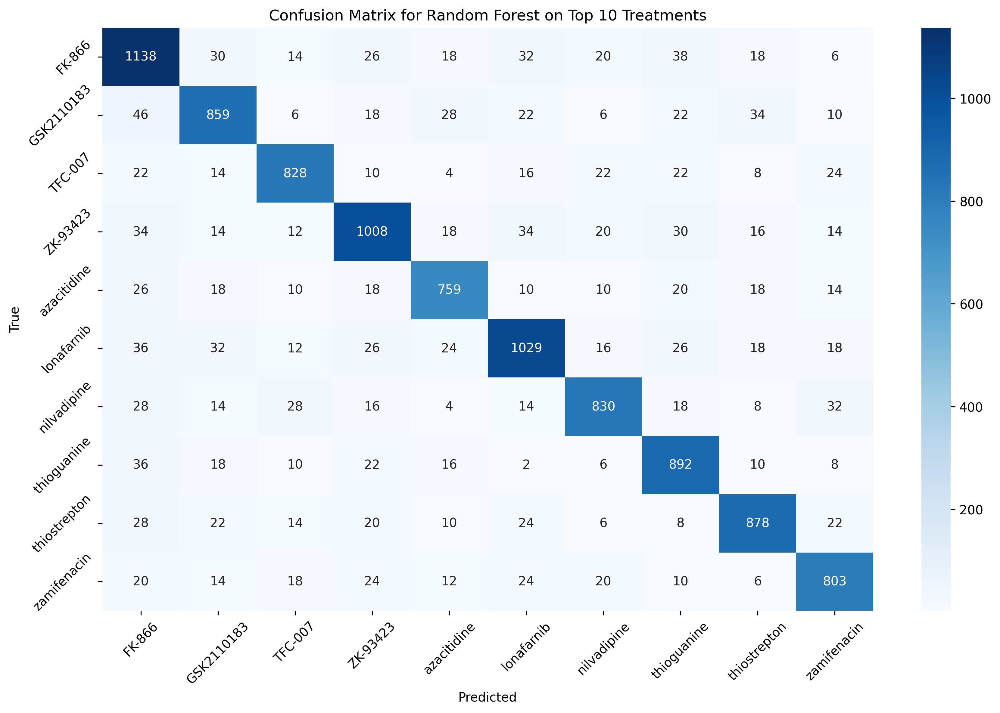

In [27]:
# Plots confusion matrix

plt.figure(figsize=(12, 8))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_top10),
            yticklabels=np.unique(y_top10))
plt.title('Confusion Matrix for Random Forest on Top 10 Treatments')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

In [23]:
# Trains random forest classifier on the principal components from the top 10 treatment groups (excluding control group)
# Accuracy 84%

X_pca_top10 = features_pca_treatments[top_10_mask, :5]
y_top10 = treatments_no_dmso[top_10_mask]

X_train, X_test, y_train, y_test = train_test_split(
    X_pca_top10, y_top10,
    test_size=0.2,
    random_state=42,
    stratify=y_top10
)

rf = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))



Classification Report:
              precision    recall  f1-score   support

      FK-866       0.80      0.85      0.83      1340
  GSK2110183       0.83      0.82      0.82      1051
     TFC-007       0.87      0.85      0.86       970
    ZK-93423       0.85      0.84      0.84      1200
 azacitidine       0.85      0.84      0.85       903
  lonafarnib       0.85      0.83      0.84      1237
 nilvadipine       0.87      0.84      0.85       992
 thioguanine       0.82      0.87      0.85      1020
thiostrepton       0.87      0.85      0.86      1032
 zamifenacin       0.84      0.84      0.84       951

    accuracy                           0.84     10696
   macro avg       0.85      0.84      0.84     10696
weighted avg       0.84      0.84      0.84     10696

